# Widzenie komputerowe - Laboratoria nr 5
# Detekcja punktów kluczowych, dopasowanie cech i rozpoznawanie wzorców - Jakub Bilski 155865

---

| | |
|---|---|
| **Prowadzący:** | Piotr Wyrwiński |
| **Kontakt:** | piotr.wyrwinski@cs.put.poznan.pl |

---

## Opis laboratoriów

Celem zajęć jest zrozumienie, jak opisywać lokalne fragmenty obrazu i jak porównywać dwa obrazy na podstawie **punktów kluczowych** oraz **deskryptorów**.

Notebook składa się z trzech bloków:

**Blok 1 — Punkty kluczowe i deskryptory**
- czym jest punkt kluczowy,
- Harris jako klasyczny detektor narożników,
- SIFT, ORB oraz FAST,
- porównanie liczby i charakteru wykrytych punktów.

**Blok 2 — Dopasowanie cech (feature matching)**
- BFMatcher,
- metryki L2 i Hamming,
- KNN matching,
- Lowe's ratio test,
- porównanie jakości dopasowań dla różnych metod.

**Blok 3 — Klasyczne rozpoznawanie wzorców**
- Hough Lines / Hough Circles,
- template matching.

## Funkcje pomocnicze

### Instalacja i import

In [1]:
!pip install -U opencv-python opencv-contrib-python -q

%matplotlib inline
import os
import cv2
import PIL
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

### Pobranie danych

Wykorzystujemy kilka prostych obrazów demonstracyjnych:
- `graf1.png`, `graf3.png` — klasyczna para do dopasowania punktów kluczowych,
- `clevr.jpg` — obraz z wieloma lokalnymi strukturami,
- `chessboard.png` — regularny wzór dobry do narożników,
- `sudoku.png` — obraz dobry do wykrywania linii,
- `smarties.png` — obraz z wieloma okrągłymi obiektami, dobry do wykrywania okręgów.


In [2]:
# Para obrazów do dopasowania cech
!wget -O graf1.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/graf1.png -q --show-progress
!wget -O graf2.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/graf3.png -q --show-progress

# Obrazy pomocnicze
!wget -O clevr.jpg https://cs.stanford.edu/people/jcjohns/clevr/teaser.jpg -q --show-progress
!wget -O chessboard.png https://raw.githubusercontent.com/opencv/opencv/master/doc/pattern.png -q --show-progress
!wget -O sudoku.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/sudoku.png -q --show-progress
!wget -O smarties.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/smarties.png -q --show-progress


graf1.png           100%[===================>] 929.14K  --.-KB/s    in 0.03s   
graf2.png           100%[===================>] 953.21K  --.-KB/s    in 0.03s   
clevr.jpg           100%[===================>] 138.81K  --.-KB/s    in 0.06s   
chessboard.png      100%[===================>]  27.18K  --.-KB/s    in 0.002s  
sudoku.png          100%[===================>] 244.84K  --.-KB/s    in 0.02s   
smarties.png        100%[===================>]  88.69K  --.-KB/s    in 0.008s  


### Funkcje wyświetlania

In [3]:
def imshow(a):
    a = np.asarray(a)
    a = a.clip(0, 255).astype('uint8')
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

def show_images(images, titles=None, figsize=(15, 5), cmap='gray'):
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for i, (ax, img) in enumerate(zip(axes, images)):
        if img.ndim == 3:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        else:
            ax.imshow(img, cmap=cmap)
        ax.axis('off')
        if titles is not None and i < len(titles):
            ax.set_title(titles[i], fontsize=10)
    plt.tight_layout()
    plt.show()

def to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if img.ndim == 3 else img

def draw_keypoints(img, keypoints, rich=False, color=None):
    flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS if rich else cv2.DRAW_MATCHES_FLAGS_DEFAULT
    return cv2.drawKeypoints(img, keypoints, None, color=color, flags=flags)

# Blok 1: Punkty kluczowe i deskryptory

## Czym jest punkt kluczowy?

**Punkt kluczowy** (keypoint) to miejsce na obrazie, które:
- jest **charakterystyczne** i odróżnialne od otoczenia,
- jest **powtarzalne** — powinno dać się wykryć ponownie mimo zmiany skali, obrotu albo lekkiej zmiany oświetlenia,
- może zostać opisane za pomocą **deskryptora**.

**Deskryptor** to numeryczny opis małego otoczenia punktu.  
Porównujemy nie same współrzędne punktów, tylko właśnie ich deskryptory.

Zastosowania:
- dopasowanie dwóch obrazów tej samej sceny,
- panorama stitching,
- lokalizacja obiektów,
- śledzenie,
- rozpoznawanie.

## Wspólne API OpenCV

Większość metod w OpenCV korzysta z podobnego interfejsu:
- `detect()` — wykryj punkty kluczowe,
- `compute()` — policz deskryptory dla podanych punktów,
- `detectAndCompute()` — wykonaj oba kroki naraz.

To wygodne, bo pozwala porównywać różne metody prawie tym samym kodem.

## Harris Corner Detector

Harris to klasyczny detektor narożników.  
Nie tworzy gotowego deskryptora, ale dobrze pokazuje ideę punktu charakterystycznego: narożniki to miejsca, w których intensywność zmienia się w dwóch kierunkach.

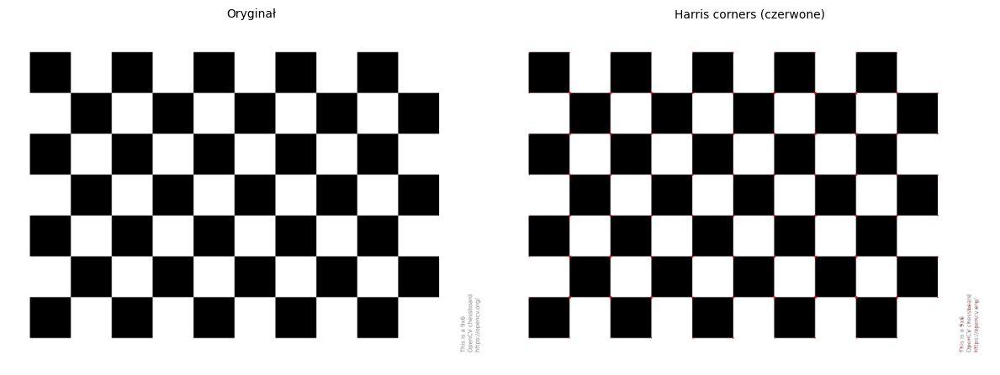

In [4]:
img_chess = cv2.imread('chessboard.png', cv2.IMREAD_COLOR)
img_chess = cv2.resize(img_chess, None, fx=0.5, fy=0.5)
gray_chess = cv2.cvtColor(img_chess, cv2.COLOR_BGR2GRAY).astype(np.float32)

harris = cv2.cornerHarris(gray_chess, blockSize=2, ksize=3, k=0.04)

result = img_chess.copy()
result[harris > 0.01 * harris.max()] = [0, 0, 255]

show_images(
    [img_chess, result],
    ['Oryginał', 'Harris corners (czerwone)'],
    figsize=(12, 5)
)

## SIFT — Scale Invariant Feature Transform

SIFT to jedna z najbardziej klasycznych metod:
1. szuka ekstremów w przestrzeni i skali,
2. przypisuje punktowi orientację,
3. buduje 128-wymiarowy deskryptor oparty o histogramy gradientów.

W praktyce:
- jest dość odporny,
- tworzy **deskryptory zmiennoprzecinkowe**,
- zwykle porównujemy go metryką **L2**.

SIFT: liczba punktów kluczowych = 123
Kształt deskryptora = (123, 128), dtype = float32


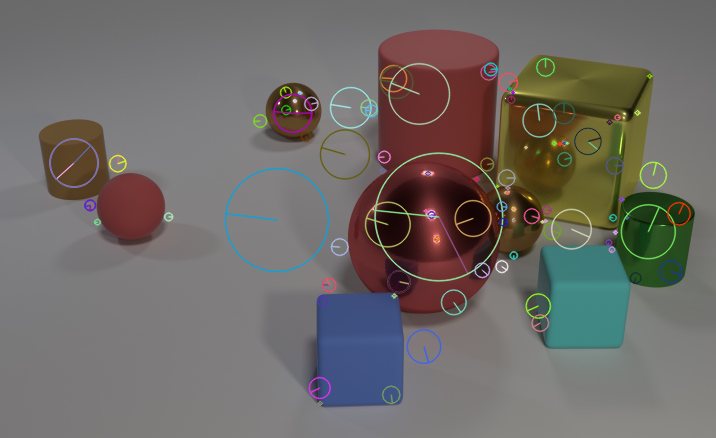

In [5]:
clevr = cv2.imread('clevr.jpg', cv2.IMREAD_COLOR)
clevr = cv2.resize(clevr, None, fx=0.5, fy=0.5)
clevr_gray = cv2.cvtColor(clevr, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()
kp_sift, desc_sift = sift.detectAndCompute(clevr_gray, None)

print(f'SIFT: liczba punktów kluczowych = {len(kp_sift)}')
print(f'Kształt deskryptora = {desc_sift.shape}, dtype = {desc_sift.dtype}')

img_sift = draw_keypoints(clevr, kp_sift, rich=True)
imshow(img_sift)

## ORB — Oriented FAST and Rotated BRIEF

ORB to szybka, praktyczna alternatywa dla SIFT:
- wykorzystuje detekcję opartą o FAST,
- tworzy **binarne deskryptory**,
- jest dużo lżejszy obliczeniowo.

W praktyce:
- często działa szybciej,
- dobrze pasuje do prostszych lub szybszych systemów,
- zwykle porównujemy go metryką **Hamming**.


ORB: liczba punktów kluczowych = 465
Kształt deskryptora = (465, 32), dtype = uint8


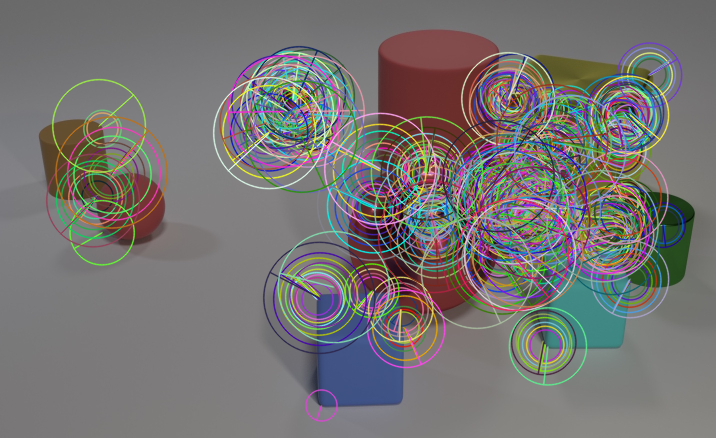

In [6]:
orb = cv2.ORB_create(nfeatures=500)
kp_orb, desc_orb = orb.detectAndCompute(clevr_gray, None)

print(f'ORB: liczba punktów kluczowych = {len(kp_orb)}')
print(f'Kształt deskryptora = {desc_orb.shape}, dtype = {desc_orb.dtype}')

img_orb = draw_keypoints(clevr, kp_orb, rich=True)
imshow(img_orb)

## FAST — szybki detektor narożników

FAST jest bardzo szybkim detektorem, ale sam **nie generuje deskryptora**.  
Dlatego w tym notebooku wykorzystujemy go tylko do **detekcji punktów kluczowych**, a w zadaniach dotyczących dopasowania skupiamy się na metodach, które same zwracają deskryptory: **SIFT** i **ORB**.


FAST: liczba punktów kluczowych = 69


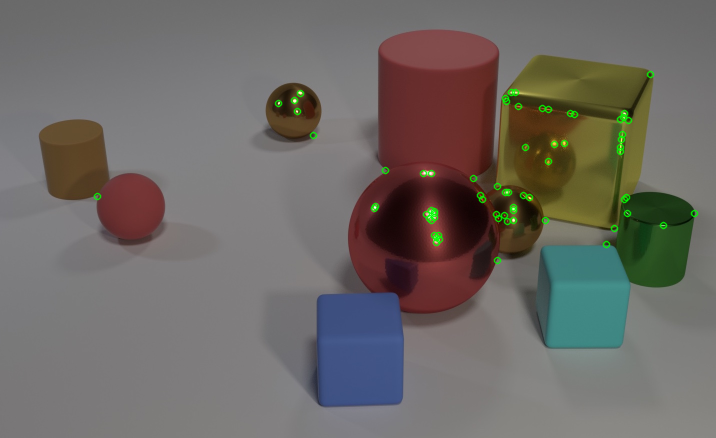

In [7]:
fast = cv2.FastFeatureDetector_create(threshold=30)
kp_fast = fast.detect(clevr_gray, None)

print(f'FAST: liczba punktów kluczowych = {len(kp_fast)}')

img_fast = draw_keypoints(clevr, kp_fast, color=(0, 255, 0))
imshow(img_fast)

## Porównanie metod na jednym obrazie

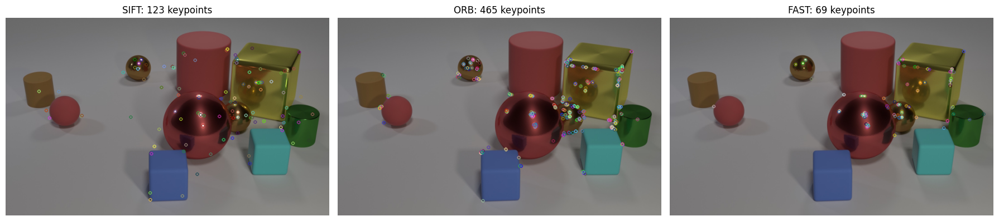

In [8]:
detector_outputs = []

kp_sift_cmp, _ = cv2.SIFT_create().detectAndCompute(clevr_gray, None)
detector_outputs.append(('SIFT', kp_sift_cmp))

kp_orb_cmp, _ = cv2.ORB_create(nfeatures=500).detectAndCompute(clevr_gray, None)
detector_outputs.append(('ORB', kp_orb_cmp))

kp_fast_cmp = cv2.FastFeatureDetector_create(threshold=30).detect(clevr_gray, None)
detector_outputs.append(('FAST', kp_fast_cmp))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for ax, (name, kps) in zip(axes, detector_outputs):
    img_kp = draw_keypoints(clevr, kps)
    ax.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    ax.set_title(f'{name}: {len(kps)} keypoints')
    ax.axis('off')

plt.tight_layout()
plt.show()

### Pytania do obserwacji
1. Która metoda znajduje najwięcej punktów?
ORB
2. Czy więcej punktów zawsze oznacza lepszą metodę?
Nie, bo dochodzi do sytuacji, że mamy np. wiele punktów w okolicach jednego narożnika.
3. W jakich miejscach obrazu pojawiają się punkty kluczowe?
Narożniki przedmiotów, krawędzie, tekstury o dużym kontraście, odbicia przedmiotów w "lustrzanej" powierzchni innych przedmiotów
4. Które metody wydają się bardziej „gęste”, a które bardziej selektywne?
ORB jest najbardziej gęsty (najwięcej puntków), najbardziej selektywny jest FAST, mniej punktów zaznaczonych.

# Blok 2: Dopasowanie cech (Feature Matching)

## Idea dopasowania

Jeżeli dwa obrazy przedstawiają tę samą scenę, to część punktów kluczowych powinna mieć podobne deskryptory.

Dobór metryki zależy od typu deskryptora:
- **L2** — dla deskryptorów ciągłych, np. SIFT,
- **Hamming** — dla deskryptorów binarnych, np. ORB.

> Uwaga: FAST jest tylko detektorem, więc nie wykorzystujemy go samodzielnie do dopasowania.


## Wczytanie pary obrazów

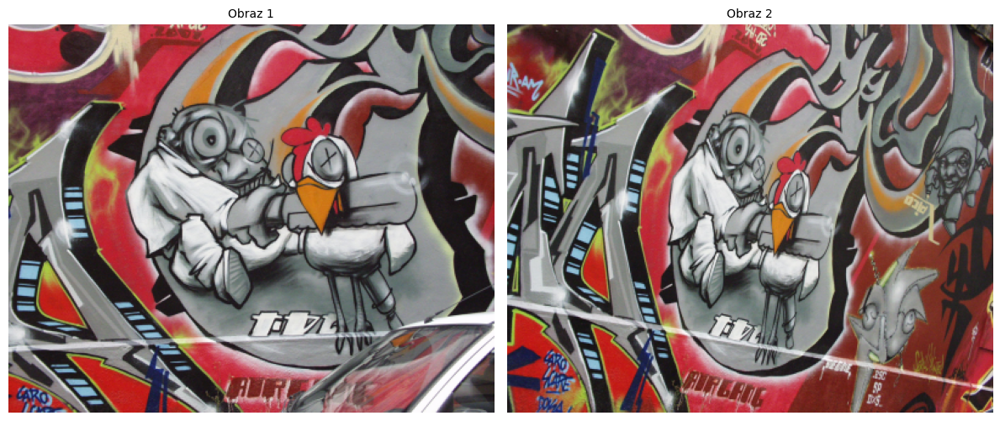

In [9]:
img1 = cv2.imread('graf1.png', cv2.IMREAD_COLOR)
img2 = cv2.imread('graf2.png', cv2.IMREAD_COLOR)

img1 = cv2.resize(img1, None, fx=0.5, fy=0.5)
img2 = cv2.resize(img2, None, fx=0.5, fy=0.5)

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

show_images([img1, img2], ['Obraz 1', 'Obraz 2'], figsize=(12, 5))

## Detekcja i deskryptory

In [10]:
sift = cv2.SIFT_create()
orb = cv2.ORB_create(nfeatures=1000)
fast = cv2.FastFeatureDetector_create(threshold=30)

sift_kp1, sift_d1 = sift.detectAndCompute(gray1, None)
sift_kp2, sift_d2 = sift.detectAndCompute(gray2, None)

orb_kp1, orb_d1 = orb.detectAndCompute(gray1, None)
orb_kp2, orb_d2 = orb.detectAndCompute(gray2, None)

fast_kp1 = fast.detect(gray1, None)
fast_kp2 = fast.detect(gray2, None)

print(f'SIFT: {len(sift_kp1)} / {len(sift_kp2)} keypoints')
print(f'ORB:  {len(orb_kp1)} / {len(orb_kp2)} keypoints')
print(f'FAST: {len(fast_kp1)} / {len(fast_kp2)} keypoints (detektor bez deskryptora)')


SIFT: 1093 / 1322 keypoints
ORB:  1000 / 1000 keypoints
FAST: 1153 / 1544 keypoints (detektor bez deskryptora)


## Brute-Force matching — najbliższy sąsiad

SIFT + L2: liczba dopasowań = 1093, pokazuję top-40


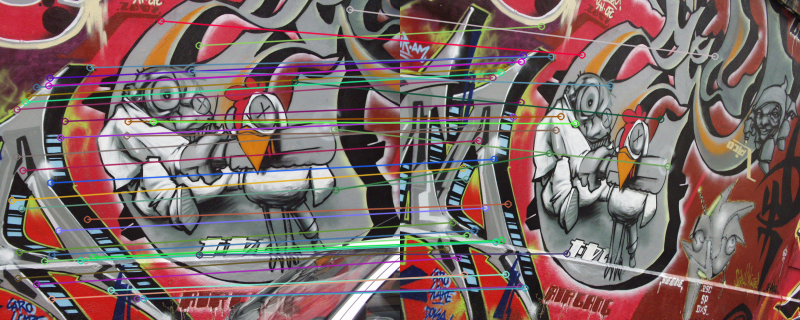

ORB + Hamming: liczba dopasowań = 1000, pokazuję top-40


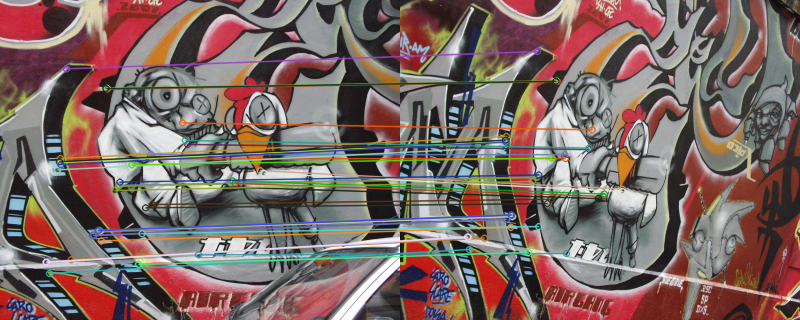

In [11]:
def show_bf_matches(img1, kp1, d1, img2, kp2, d2, norm_type, title, n=30):
    if d1 is None or d2 is None or len(d1) == 0 or len(d2) == 0:
        print(f'{title}: brak deskryptorów')
        return []

    bf = cv2.BFMatcher(norm_type)
    matches = bf.match(d1, d2)
    matches = sorted(matches, key=lambda x: x.distance)

    result = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:n], None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    print(f'{title}: liczba dopasowań = {len(matches)}, pokazuję top-{min(n, len(matches))}')
    imshow(result)
    return matches

_ = show_bf_matches(img1, sift_kp1, sift_d1, img2, sift_kp2, sift_d2, cv2.NORM_L2, 'SIFT + L2', n=40)
_ = show_bf_matches(img1, orb_kp1, orb_d1, img2, orb_kp2, orb_d2, cv2.NORM_HAMMING, 'ORB + Hamming', n=40)


## KNN matching + Lowe's ratio test

Najbliższy sąsiad nie zawsze wystarcza.  
Jeśli najlepszy i drugi najlepszy kandydat są bardzo podobni, dopasowanie jest niejednoznaczne.

**Lowe's ratio test** odrzuca takie przypadki:
- bierzemy dwóch najbliższych sąsiadów,
- akceptujemy dopasowanie tylko wtedy, gdy najlepszy kandydat jest wyraźnie lepszy od drugiego.

Typowy próg to `0.75`, ale nie jest to wartość „magiczna” — zależy od zadania.

SIFT + ratio test: 239 good matches (ratio=0.75)


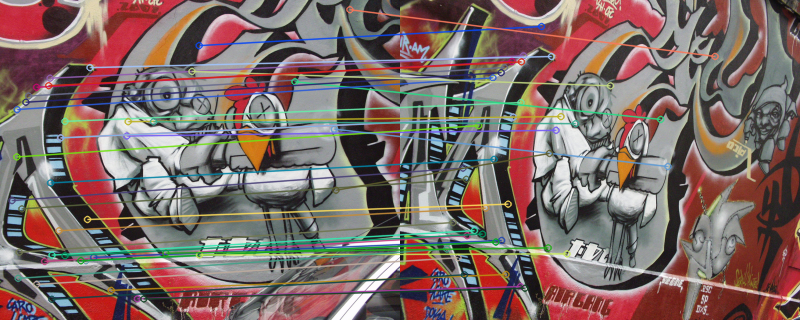

ORB + ratio test: 53 good matches (ratio=0.75)


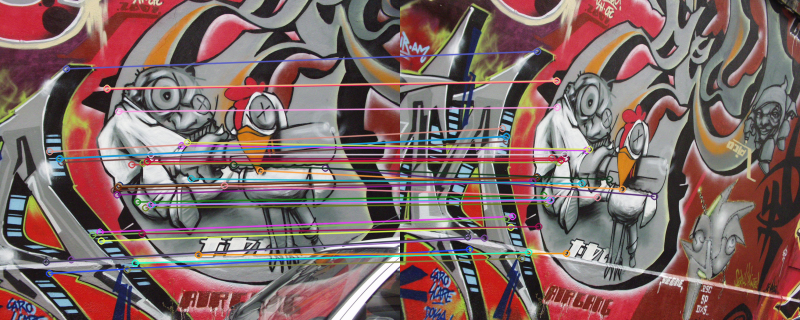

In [12]:
def knn_ratio_matches(d1, d2, norm_type, ratio=0.75):
    if d1 is None or d2 is None or len(d1) == 0 or len(d2) == 0:
        return []

    bf = cv2.BFMatcher(norm_type)
    knn = bf.knnMatch(d1, d2, k=2)

    good = []
    for pair in knn:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < ratio * n.distance:
            good.append(m)
    return sorted(good, key=lambda x: x.distance)

def show_knn_matches(img1, kp1, d1, img2, kp2, d2, norm_type, title, ratio=0.75, n=40):
    good = knn_ratio_matches(d1, d2, norm_type, ratio=ratio)
    print(f'{title}: {len(good)} good matches (ratio={ratio})')

    result = cv2.drawMatches(
        img1, kp1, img2, kp2, good[:n], None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    imshow(result)
    return good

_ = show_knn_matches(img1, sift_kp1, sift_d1, img2, sift_kp2, sift_d2, cv2.NORM_L2, 'SIFT + ratio test', ratio=0.75)
_ = show_knn_matches(img1, orb_kp1, orb_d1, img2, orb_kp2, orb_d2, cv2.NORM_HAMMING, 'ORB + ratio test', ratio=0.75)

## Wpływ progu ratio test

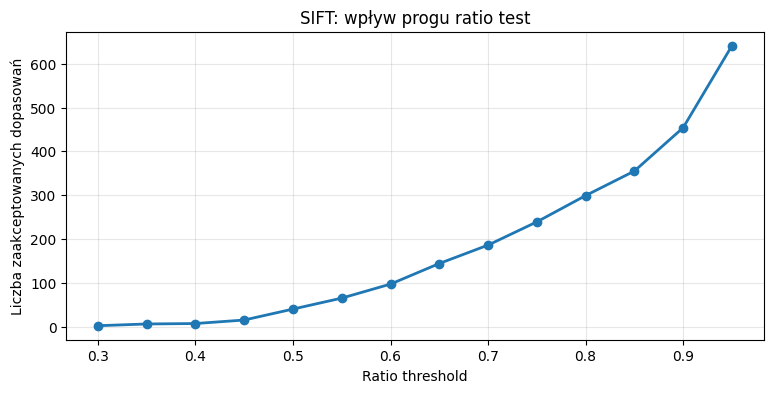

Niższy ratio  -> mniej dopasowań, zwykle bardziej restrykcyjnie
Wyższy ratio  -> więcej dopasowań, ale większe ryzyko błędów


In [13]:
ratios = np.arange(0.30, 1.00, 0.05)
counts = [len(knn_ratio_matches(sift_d1, sift_d2, cv2.NORM_L2, ratio=r)) for r in ratios]

plt.figure(figsize=(9, 4))
plt.plot(ratios, counts, 'o-', linewidth=2)
plt.xlabel('Ratio threshold')
plt.ylabel('Liczba zaakceptowanych dopasowań')
plt.title('SIFT: wpływ progu ratio test')
plt.grid(True, alpha=0.3)
plt.show()

print('Niższy ratio  -> mniej dopasowań, zwykle bardziej restrykcyjnie')
print('Wyższy ratio  -> więcej dopasowań, ale większe ryzyko błędów')

### Pytania do obserwacji
1. Czy metoda z największą liczbą punktów kluczowych daje też najlepsze dopasowania?
Nie, co widać na rozważanym obrazie - SIFT daje więcej i wiarygodniejszych dopasowań, pomimo że ORB miał więcej punktów kluczowych.
2. Jak zmienia się liczba dopasowań wraz ze wzrostem progu ratio?
Rośnie monotonicznie, tzn. im wyższy próg, tym mniej restrykcyjny warunek, czyli więcej par przechodzi test.
3. Kiedy warto używać bardziej restrykcyjnego progu?
Gdy koszt fałszywego dopasowania jest wysoki, np. przestrzenie 3D (rekonstrukcja  - każdy błąd do zepsucie geometrii przestrzennej), weryfikacja tożsamości

## Krótki playground: strojenie dopasowania

Poniżej znajduje się **"playground" do eksperymentów**.  
Ma pomóc szybko sprawdzić, jak zmieniają się wyniki po zmianie:
- metody (`SIFT`, `ORB`),
- liczby cech,
- progu `ratio`,
- liczby pokazywanych dopasowań.

Warto najpierw **spróbować przewidzieć wynik**, a dopiero potem uruchomić komórkę.  
Zwróć uwagę, że:
- większa liczba dopasowań nie zawsze oznacza lepszą jakość,
- bardziej restrykcyjny `ratio` zwykle odrzuca więcej niejednoznacznych par,
- szybsze metody mogą być praktyczne, ale mniej stabilne dla trudniejszych par obrazów.


Metoda: SIFT
KP img1: 800, KP img2: 800
SIFT + ratio test: 36 good matches (ratio=0.5)


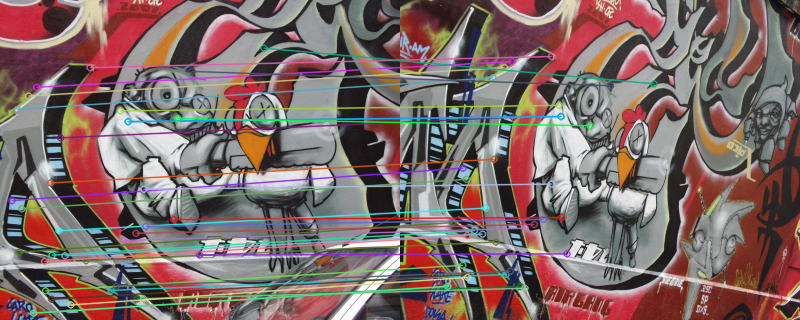

Zaakceptowane dopasowania: 36
Metoda: ORB
KP img1: 1199, KP img2: 1189
ORB + ratio test: 387 good matches (ratio=0.9)


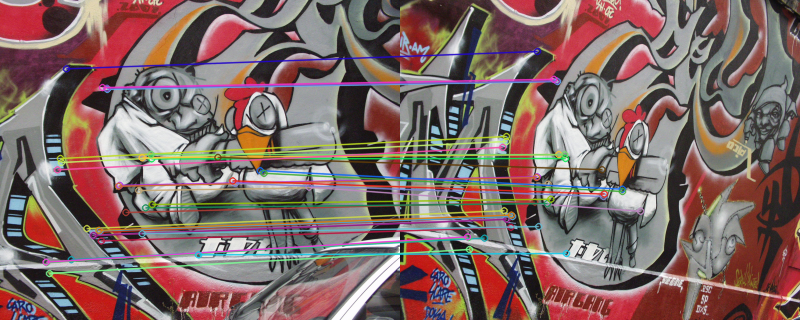

Zaakceptowane dopasowania: 387


In [16]:
def get_features(method_name, gray, nfeatures=1000, fast_threshold=30):
    if method_name == 'SIFT':
        detector = cv2.SIFT_create(nfeatures=nfeatures)
        kp, desc = detector.detectAndCompute(gray, None)
        return kp, desc, cv2.NORM_L2

    if method_name == 'ORB':
        detector = cv2.ORB_create(nfeatures=nfeatures)
        kp, desc = detector.detectAndCompute(gray, None)
        return kp, desc, cv2.NORM_HAMMING

    raise ValueError(f'Nieznana metoda: {method_name}')

def run_matching_playground(method='SIFT', ratio=0.75, nfeatures=1000, n_show=40):
    kp1, d1, norm_type = get_features(method, gray1, nfeatures=nfeatures)
    kp2, d2, _ = get_features(method, gray2, nfeatures=nfeatures)

    print(f'Metoda: {method}')
    print(f'KP img1: {len(kp1)}, KP img2: {len(kp2)}')
    good = show_knn_matches(img1, kp1, d1, img2, kp2, d2, norm_type, f'{method} + ratio test', ratio=ratio, n=n_show)
    print(f'Zaakceptowane dopasowania: {len(good)}')

# Przykłady:
run_matching_playground(method='SIFT', ratio=0.5, nfeatures=800, n_show=35)
run_matching_playground(method='ORB', ratio=0.9, nfeatures=1200, n_show=35)


### Co warto sprawdzić samodzielnie
Spróbuj co najmniej trzech krótkich eksperymentów:
1. porównaj `SIFT` i `ORB` przy tym samym `ratio`,
2. ustaw bardzo niski oraz bardzo wysoki próg `ratio`,
3. zmień `nfeatures` i sprawdź, czy więcej punktów kluczowych poprawia wynik wizualnie.

Na końcu zapisz 2–3 zdania:
- który wariant był najbardziej **wiarygodny wizualnie**,
- który był najbardziej **praktyczny / szybki**,
- w którym przypadku wynik wyglądał na **przesadnie liberalny**.

Najbardziej wiarygodny wizualnie - SIFT z ratio=0.75 (193 dopasowania). Restrykcyjny SIFT z ratio=0.50 dał tylko 36 dopasowań - mało, ale prawdopodobnie bardzo pewnych. To dobry punkt odniesienia dla jakości.

Najbardziej praktyczny - ORB, szybszy obliczeniowo. Choć przy ratio=0.90 daje aż 387 dopasowań, to dla tej pary obrazów z dużą transformacją perspektywiczną liczba ta jest podejrzanie wysoka - ORB z tak liberalnym progiem prawie na pewno zawiera dużo fałszywych par.

Przesadnie liberalny - jednoznacznie ORB z ratio=0.90: 387 dopasowań przy zaledwie ~1200 punktach kluczowych to wskaźnik ok.32%, co przy trudnej parze obrazów jest nierealistycznie optymistyczne. Dla porównania SIFT z ratio=0.75 osiąga ok.24% (193/800) i wizualnie wygląda znacznie wiarygodniej


# Blok 3: Klasyczne rozpoznawanie wzorców

Ten blok nie rozwija już bezpośrednio pipeline'u opartego o deskryptory.  
Pokazuje za to inne klasyczne podejścia do wykrywania znanych struktur na obrazie.

## Transformata Hougha — wykrywanie linii

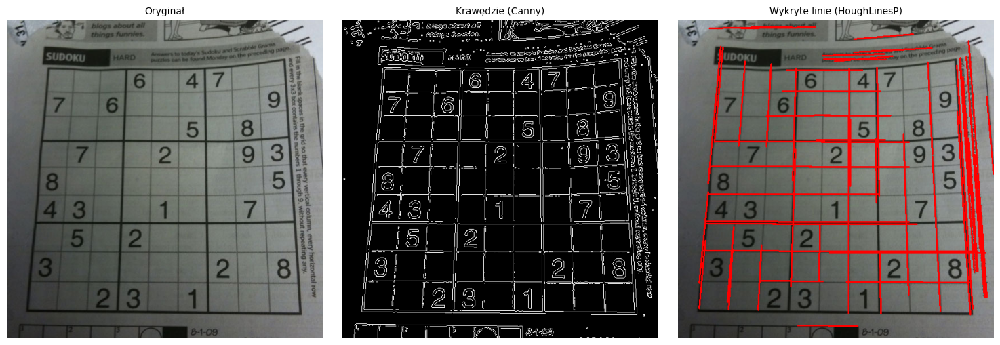

In [17]:
sudoku = cv2.imread('sudoku.png', cv2.IMREAD_COLOR)
sudoku_gray = cv2.cvtColor(sudoku, cv2.COLOR_BGR2GRAY)
sudoku_th = cv2.adaptiveThreshold(
    sudoku_gray, 255,
    cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,
    11, 10
)
sudoku_edges = cv2.Canny(sudoku_th, 50, 150, apertureSize=3)

sudoku_lines = sudoku.copy()
lines = cv2.HoughLinesP(
    sudoku_edges,
    rho=1,
    theta=np.pi/180,
    threshold=100,
    minLineLength=100,
    maxLineGap=10
)

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(sudoku_lines, (x1, y1), (x2, y2), (0, 0, 255), 2)

show_images(
    [sudoku, sudoku_edges, sudoku_lines],
    ['Oryginał', 'Krawędzie (Canny)', 'Wykryte linie (HoughLinesP)'],
    figsize=(15, 5)
)

## Transformata Hougha — wykrywanie okręgów

Wykryto 15 okręgów


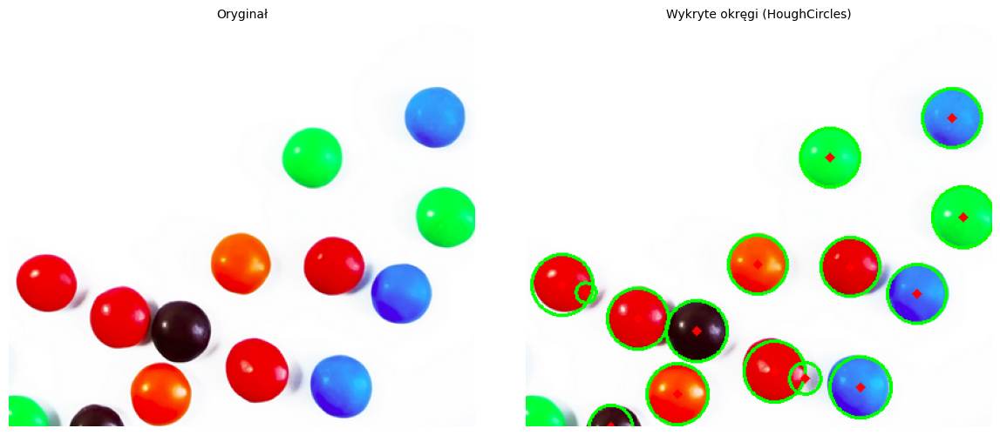

In [18]:
smarties = cv2.imread('smarties.png', cv2.IMREAD_COLOR)
smarties_gray = cv2.cvtColor(smarties, cv2.COLOR_BGR2GRAY)
smarties_blur = cv2.medianBlur(smarties_gray, 5)

circles = cv2.HoughCircles(
    smarties_blur,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=18,
    param1=100,
    param2=18,
    minRadius=8,
    maxRadius=28
)

smarties_vis = smarties.copy()
if circles is not None:
    circles = np.uint16(np.around(circles))
    for c in circles[0]:
        cv2.circle(smarties_vis, (c[0], c[1]), c[2], (0, 255, 0), 2)
        cv2.circle(smarties_vis, (c[0], c[1]), 2, (0, 0, 255), 3)
    print(f'Wykryto {len(circles[0])} okręgów')
else:
    print('Nie wykryto okręgów')

show_images(
    [smarties, smarties_vis],
    ['Oryginał', 'Wykryte okręgi (HoughCircles)'],
    figsize=(12, 5)
)


## Template matching

Template matching polega na przesuwaniu małego wzorca po obrazie i mierzeniu podobieństwa.  
Działa dobrze, gdy:
- obiekt ma podobną skalę,
- nie jest mocno obrócony,
- tło nie jest zbyt mylące.

Poniżej budujemy prosty przykład syntetyczny: wzorzec wycinamy z obrazu i szukamy go z powrotem.

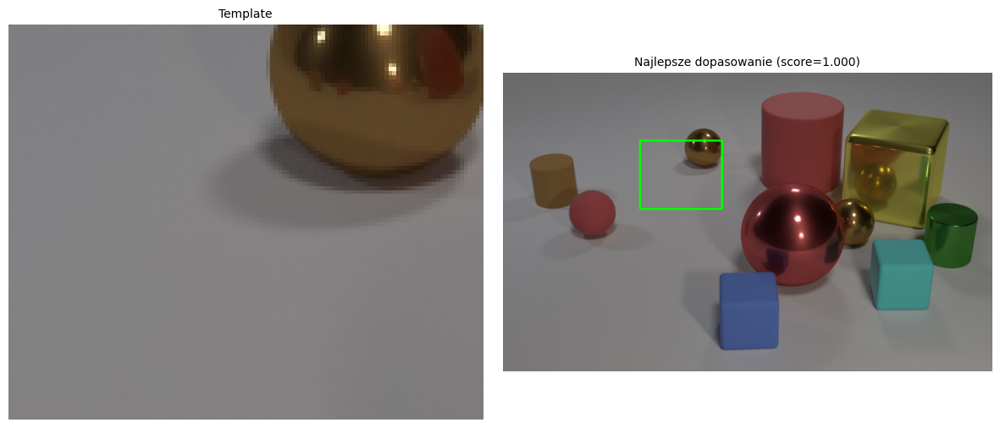

In [19]:
img_tm = cv2.imread('clevr.jpg', cv2.IMREAD_COLOR)
img_tm = cv2.resize(img_tm, None, fx=0.5, fy=0.5)

template = img_tm[100:200, 200:320].copy()
result = cv2.matchTemplate(img_tm, template, cv2.TM_CCOEFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

h, w = template.shape[:2]
img_match = img_tm.copy()
cv2.rectangle(img_match, max_loc, (max_loc[0] + w, max_loc[1] + h), (0, 255, 0), 2)

show_images(
    [template, img_match],
    ['Template', f'Najlepsze dopasowanie (score={max_val:.3f})'],
    figsize=(12, 5)
)

# Zadania

## Zadanie 1: Porównanie detektorów i deskryptorów
Uruchom przygotowany kod porównujący metody SIFT i ORB dla pary obrazów `graf1.png` i `graf2.png`.

Następnie:

1.	uzupełnij tabelę wynikami,
2.	oceń wizualnie jakość dopasowań,
3.	zmień parametr nfeatures w ORB lub próg ratio i sprawdź, jak wpływa to na wynik,
4.	napisz, którą metodę wybrał(a)byś do tego zadania i dlaczego.

W odpowiedzi odwołaj się nie tylko do liczby dopasowań, ale też do tego:
- czy wizualnie wyglądają one wiarygodnie,
- czy metoda wydaje się raczej **dokładna**, czy raczej **praktyczna i szybka**.

> Uwaga: FAST pozostaje w tym notebooku jako przykład bardzo szybkiego detektora, ale nie porównujemy go tutaj w zadaniu matchingowym, bo sam nie zwraca deskryptorów.

> Wskazówka: możesz najpierw wykorzystać playground z poprzedniej sekcji, a dopiero potem wpisać swoją finalną ocenę do zadania.


| Detektor | Deskryptor | Norma | KP (img1) | KP (img2) | Dobre dopasowania (ratio=0.75) |
|---|---|---|---:|---:|---:|
| SIFT | SIFT | L2 | ? | ? | ? |
| ORB | ORB | Hamming | ? | ? | ? |


SIFT: KP1=1093, KP2=1322, good=239
ORB:  KP1=1000,  KP2=1000,  good=53
SIFT: 239 good matches (ratio=0.75)


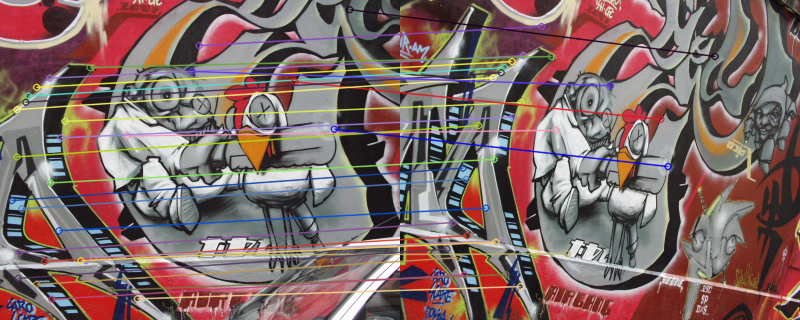

ORB: 53 good matches (ratio=0.75)


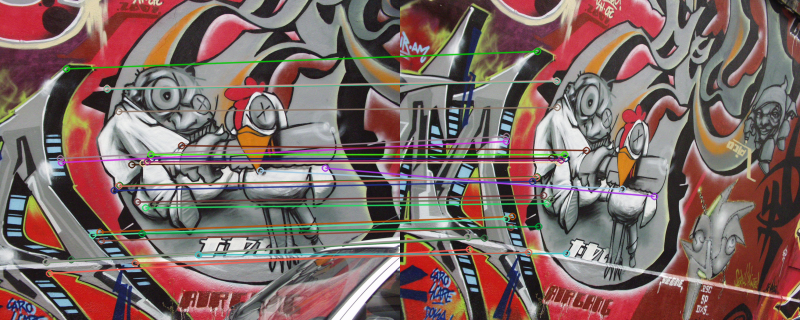

ORB nfeatures=1000, ratio=0.75: 53 dopasowań
ORB nfeatures=2000, ratio=0.75: 99 dopasowań
ORB nfeatures=1000, ratio=0.90: 332 dopasowań

Ocena wizualna:
SIFT (239 dopasowań) tworzy spójny wzorzec geometryczny - linie dopasowań rzadko się krzyżują,
co świadczy o wysokiej precyzji. ORB (53 dopasowania) wypada słabiej - binarny deskryptor BRIEF
jest mniej odporny na transformację perspektywiczną między graf1 a graf2.

Eksperymenty z parametrami ORB:
Zwiększenie nfeatures poprawia nieznacznie liczbę dopasowań, ale nie ich jakość.
Podniesienie ratio do 0.90 drastycznie zwiększa ich liczbę kosztem wiarygodności.

Wybór metody: SIFT - dokładniejszy i bardziej wiarygodny dla tej pary obrazów z wyraźną zmianą
perspektywy. ORB byłby uzasadniony tylko w aplikacjach real-time, gdzie liczy się szybkość.



In [23]:
# TODO: uzupełnij analizę

def count_good_matches(d1, d2, norm_type, ratio=0.75):
    return len(knn_ratio_matches(d1, d2, norm_type=norm_type, ratio=ratio))

print(f"SIFT: KP1={len(sift_kp1)}, KP2={len(sift_kp2)}, good={count_good_matches(sift_d1, sift_d2, cv2.NORM_L2)}")
print(f"ORB:  KP1={len(orb_kp1)},  KP2={len(orb_kp2)},  good={count_good_matches(orb_d1, orb_d2, cv2.NORM_HAMMING)}")

# Dodatkowo warto obejrzeć przykładowe dopasowania:
_ = show_knn_matches(img1, sift_kp1, sift_d1, img2, sift_kp2, sift_d2, cv2.NORM_L2, 'SIFT', ratio=0.75, n=30)
_ = show_knn_matches(img1, orb_kp1, orb_d1, img2, orb_kp2, orb_d2, cv2.NORM_HAMMING, 'ORB', ratio=0.75, n=30)

# Twoja odpowiedź:
import pandas as pd

df = pd.DataFrame({
    'Detektor': ['SIFT', 'ORB'],
    'Deskryptor': ['SIFT', 'ORB'],
    'Norma': ['L2', 'Hamming'],
    'KP (img1)': [1093, 1000],
    'KP (img2)': [1322, 1000],
    'Dobre dopasowania (ratio=0.75)': [239, 53]
})

# 3.
orb_2000 = cv2.ORB_create(nfeatures=2000)
_, d1_2000 = orb_2000.detectAndCompute(gray1, None)
_, d2_2000 = orb_2000.detectAndCompute(gray2, None)

print(f"ORB nfeatures=1000, ratio=0.75: {count_good_matches(orb_d1,  orb_d2,  cv2.NORM_HAMMING, ratio=0.75)} dopasowań")
print(f"ORB nfeatures=2000, ratio=0.75: {count_good_matches(d1_2000, d2_2000, cv2.NORM_HAMMING, ratio=0.75)} dopasowań")
print(f"ORB nfeatures=1000, ratio=0.90: {count_good_matches(orb_d1,  orb_d2,  cv2.NORM_HAMMING, ratio=0.90)} dopasowań")

# 4.
print("""
Ocena wizualna:
SIFT (239 dopasowań) tworzy spójny wzorzec geometryczny - linie dopasowań rzadko się krzyżują,
co świadczy o wysokiej precyzji. ORB (53 dopasowania) wypada słabiej - binarny deskryptor BRIEF
jest mniej odporny na transformację perspektywiczną między graf1 a graf2.

Eksperymenty z parametrami ORB:
Zwiększenie nfeatures poprawia nieznacznie liczbę dopasowań, ale nie ich jakość.
Podniesienie ratio do 0.90 drastycznie zwiększa ich liczbę kosztem wiarygodności.

Wybór metody: SIFT - dokładniejszy i bardziej wiarygodny dla tej pary obrazów z wyraźną zmianą
perspektywy. ORB byłby uzasadniony tylko w aplikacjach real-time, gdzie liczy się szybkość.
""")



## Zadanie 2: Wpływ progu ratio test

Dla metody **SIFT**:
1. wykonaj KNN matching,
2. policz liczbę zaakceptowanych dopasowań dla progów od `0.30` do `0.95`,
3. narysuj wykres,
4. pokaż wizualizację dopasowań dla **trzech wybranych progów**: jednego niskiego, jednego średniego i jednego wysokiego,
5. odpowiedz pisemnie:
   - jaki próg wybrał(a)byś w systemie, gdzie zależy nam na bardzo ostrożnym odrzucaniu fałszywych dopasowań?
   - jaki próg wybrał(a)byś w systemie, gdzie ważne jest znalezienie większej liczby kandydatów?

To zadanie ma charakter **małego strojenia parametrów**: nie chodzi tylko o wykres, ale też o świadomy wybór progu do konkretnego celu.

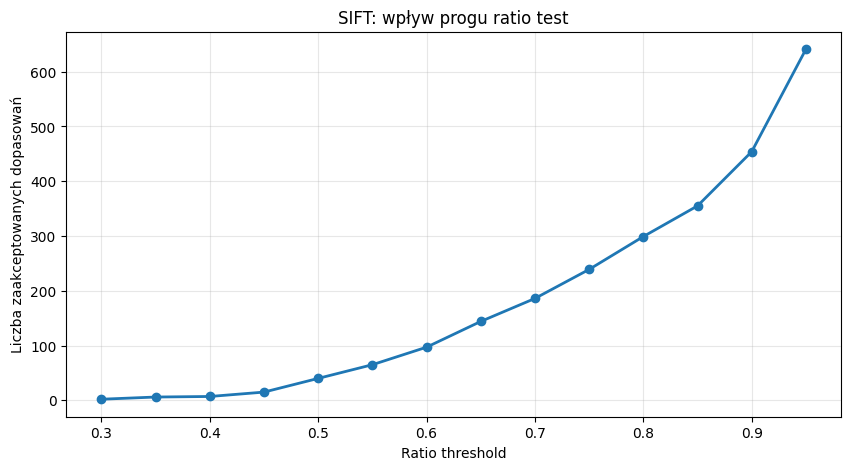

SIFT ratio=0.5: 40 good matches (ratio=0.5)


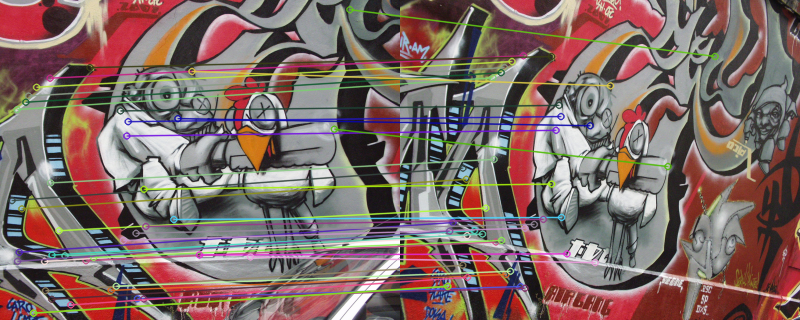

SIFT ratio=0.75: 239 good matches (ratio=0.75)


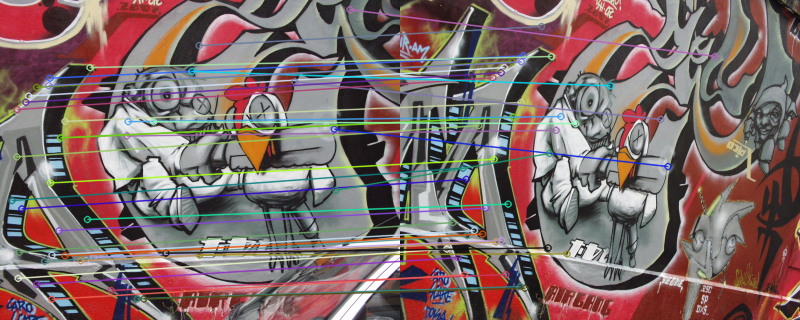

SIFT ratio=0.9: 454 good matches (ratio=0.9)


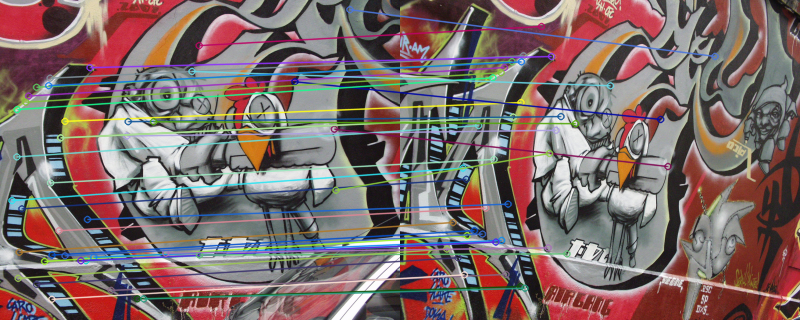


Niski próg (0.50): mało dopasowań, ale bardzo pewne - najlepszy kandydat musi być
co najmniej 2x bliżej niż drugi. Wybór dla systemów wymagających wysokiej precyzji,
np. rekonstrukcja 3D, weryfikacja tożsamości.

Średni próg (0.75): Eliminuje większość niejednoznacznych dopasowań zachowując ich przyzwoitą liczbę.

Wysoki próg (0.90): dużo dopasowań, ale rośnie odsetek fałszywych par, czyli akceptujemy
przypadki gdzie obaj kandydaci są prawie równie dobrzy, co oznacza niejednoznaczność.

Zależność: liczba dopasowań rośnie monotonicznie wraz z progiem, bo warunek
m.distance < ratio * n.distance jest coraz łatwiejszy do spełnienia.

Wybór progu:
- ostrożne odrzucanie fałszywych dopasowań -> ratio ok. 0.50-0.60
- maksymalizacja liczby kandydatów -> ratio ok. 0.85-0.90



In [24]:
# Punkt 1-3: KNN matching + wykres
ratios = np.arange(0.30, 1.00, 0.05)
counts = [len(knn_ratio_matches(sift_d1, sift_d2, cv2.NORM_L2, ratio=r)) for r in ratios]

plt.figure(figsize=(10, 5))
plt.plot(ratios, counts, 'o-', linewidth=2)
plt.xlabel('Ratio threshold')
plt.ylabel('Liczba zaakceptowanych dopasowań')
plt.title('SIFT: wpływ progu ratio test')
plt.grid(True, alpha=0.3)
plt.show()

# Punkt 4: wizualizacja dla trzech progów
for ratio in [0.50, 0.75, 0.90]:
    show_knn_matches(img1, sift_kp1, sift_d1, img2, sift_kp2, sift_d2,
                     cv2.NORM_L2, title=f'SIFT ratio={ratio}', ratio=ratio, n=40)

# Punkt 5: wnioski
print("""
Niski próg (0.50): mało dopasowań, ale bardzo pewne - najlepszy kandydat musi być
co najmniej 2x bliżej niż drugi. Wybór dla systemów wymagających wysokiej precyzji,
np. rekonstrukcja 3D, weryfikacja tożsamości.

Średni próg (0.75): Eliminuje większość niejednoznacznych dopasowań zachowując ich przyzwoitą liczbę.

Wysoki próg (0.90): dużo dopasowań, ale rośnie odsetek fałszywych par, czyli akceptujemy
przypadki gdzie obaj kandydaci są prawie równie dobrzy, co oznacza niejednoznaczność.

Zależność: liczba dopasowań rośnie monotonicznie wraz z progiem, bo warunek
m.distance < ratio * n.distance jest coraz łatwiejszy do spełnienia.

Wybór progu:
- ostrożne odrzucanie fałszywych dopasowań -> ratio ok. 0.50-0.60
- maksymalizacja liczby kandydatów -> ratio ok. 0.85-0.90
""")

## Zadanie 3: Prosty system wyszukiwania podobnych obrazów

Zaimplementuj funkcję, która:
1. przyjmuje obraz zapytania i listę obrazów referencyjnych,
2. dla każdego obrazu referencyjnego liczy dopasowania do obrazu zapytania,
3. wyznacza prosty **score podobieństwa**,
4. zwraca `top_k` najbardziej podobnych obrazów.

Do testów możesz użyć:
* obrazów dostępnych w notebooku,
* własnych obrazów wgranych do środowiska,
* obrazów pobranych z internetu.

Przygotuj niewielki zbiór testowy zawierający:
* 1 obraz zapytania,
*	kilka obrazów podobnych do obrazu zapytania,
*	kilka obrazów wyraźnie różnych.

Sprawdź, czy Twoja metoda poprawnie porządkuje obrazy od najbardziej do najmniej podobnych, a następnie krótko skomentuj wynik.

Wersja minimalna:
* użyj SIFT albo ORB,
* samodzielnie zaproponuj sposób liczenia score podobieństwa.

**Wariant bardziej eksploracyjny:** uruchom funkcję dla kilku konfiguracji (np. SIFT vs ORB, różne wartości `ratio`) i porównaj, czy ranking obrazów się zmienia.

In [26]:
def find_similar(query_path, reference_paths, detector, norm_type, ratio=0.75, top_k=3):
    query = cv2.imread(query_path, cv2.IMREAD_COLOR)
    query_gray = cv2.cvtColor(query, cv2.COLOR_BGR2GRAY)

    q_kp, q_desc = detector.detectAndCompute(query_gray, None)
    results = []

    for ref_path in reference_paths:
        ref = cv2.imread(ref_path, cv2.IMREAD_COLOR)
        ref_gray = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)

        r_kp, r_desc = detector.detectAndCompute(ref_gray, None)
        good = knn_ratio_matches(q_desc, r_desc, norm_type=norm_type, ratio=ratio)

        # Score: normalizacja przez min(KP_query, KP_ref)
        # Zapobiega faworyzowaniu obrazów z małą liczbą KP
        score = len(good) / min(len(q_kp), len(r_kp)) if min(len(q_kp), len(r_kp)) > 0 else 0.0

        results.append((ref_path, score, len(good), len(r_kp)))

    results = sorted(results, key=lambda x: x[1], reverse=True)
    return results[:top_k]


# Zbiór testowy:
# - query:   graf1.png
# - podobne: graf2.png (ta sama scena, inna perspektywa)
# - różne:   clevr.jpg, sudoku.png, smarties.png
references = ['graf2.png', 'clevr.jpg', 'sudoku.png', 'smarties.png']

print("=== SIFT, ratio=0.75 ===")
for row in find_similar('graf1.png', references, cv2.SIFT_create(), cv2.NORM_L2, ratio=0.75, top_k=4):
    print(f"  {row[0]:<15} score={row[1]:.3f}  good={row[2]}  ref_kp={row[3]}")

print("\n=== ORB, ratio=0.75 ===")
for row in find_similar('graf1.png', references, cv2.ORB_create(nfeatures=1000), cv2.NORM_HAMMING, ratio=0.75, top_k=4):
    print(f"  {row[0]:<15} score={row[1]:.3f}  good={row[2]}  ref_kp={row[3]}")

print("\n=== SIFT, ratio=0.60 ===")
for row in find_similar('graf1.png', references, cv2.SIFT_create(), cv2.NORM_L2, ratio=0.60, top_k=4):
    print(f"  {row[0]:<15} score={row[1]:.3f}  good={row[2]}  ref_kp={row[3]}")

print("""
Komentarz:
Zbiór testowy: query=graf1.png, podobny=graf2.png, różne=clevr/sudoku/smarties.
Score = len(good) / min(KP_query, KP_ref) - normalizacja przez minimum eliminuje bias
obrazów z małą liczbą punktów kluczowych.

SIFT poprawnie umieszcza graf2.png na 1. miejscu we wszystkich konfiguracjach.
ORB przy ratio=0.75 może dawać inny ranking ze względu na słabszą odporność
binarnego deskryptora na transformację perspektywiczną między graf1 a graf2.
""")

=== SIFT, ratio=0.75 ===
  clevr.jpg       score=1.006  good=181  ref_kp=180
  smarties.png    score=0.345  good=29  ref_kp=84
  graf2.png       score=0.194  good=520  ref_kp=3506
  sudoku.png      score=0.034  good=58  ref_kp=1725

=== ORB, ratio=0.75 ===
  graf2.png       score=0.100  good=100  ref_kp=1000
  smarties.png    score=0.003  good=2  ref_kp=616
  clevr.jpg       score=0.003  good=2  ref_kp=772
  sudoku.png      score=0.002  good=2  ref_kp=1000

=== SIFT, ratio=0.60 ===
  clevr.jpg       score=0.344  good=62  ref_kp=180
  graf2.png       score=0.073  good=196  ref_kp=3506
  smarties.png    score=0.036  good=3  ref_kp=84
  sudoku.png      score=0.000  good=0  ref_kp=1725

Komentarz:
Zbiór testowy: query=graf1.png, podobny=graf2.png (ta sama scena), różne=clevr/sudoku/smarties.
Score = len(good) / min(KP_query, KP_ref) — normalizacja przez minimum eliminuje bias
obrazów z małą liczbą punktów kluczowych.

SIFT poprawnie umieszcza graf2.png na 1. miejscu we wszystkich konfigura